In [32]:
import pandas as pd
import numpy as np
import yfinance as yf
import plotly.offline as pyo
import plotly.graph_objects as go

from plotly.subplots import make_subplots

pyo.init_notebook_mode(connected=True)
pd.options.plotting.backend = 'plotly'

In [34]:
df = yf.download(['TCS.NS', 'INFY.NS', 'WIPRO.NS', 'HCLTECH.NS', 'TECHM.NS', '^CNXIT'], start='2005-01-01')
df

[*********************100%***********************]  6 of 6 completed


Price             Close                                                     \
Ticker       HCLTECH.NS      INFY.NS       TCS.NS     TECHM.NS    WIPRO.NS   
Date                                                                         
2005-01-03    25.182714    84.667358   110.342461          NaN   33.039150   
2005-01-04    25.002735    83.488937   109.364037          NaN   32.813538   
2005-01-05    24.107151    81.988968   108.038223          NaN   30.984600   
2005-01-06    23.171276    81.639450   107.668060          NaN   30.200466   
2005-01-07    23.498112    81.921082   109.258034          NaN   30.653877   
...                 ...          ...          ...          ...         ...   
2026-02-05  1610.000000  1520.199951  2991.500000  1646.199951  233.389999   
2026-02-06  1593.699951  1507.099976  2941.600098  1619.900024  230.720001   
2026-02-09  1602.000000  1497.199951  2948.199951  1621.699951  230.080002   
2026-02-10  1573.099976  1497.800049  2984.600098  1644.599976  231.470001   
2026-02-11  1568.500000  1503.400024  2983.600098  1648.599976  232.199997   

Price                            High                                         \
Ticker            ^CNXIT   HCLTECH.NS      INFY.NS       TCS.NS     TECHM.NS   
Date                                                                           
2005-01-03           NaN    25.269105    95.790295   110.622947          NaN   
2005-01-04           NaN    25.341097    84.885045   110.402833          NaN   
2005-01-05           NaN    25.053123    83.087480   109.277601          NaN   
2005-01-06           NaN    24.477208    83.644733   109.750552          NaN   
2005-01-07           NaN    23.742883    82.488312   109.668990          NaN   
...                  ...          ...          ...          ...          ...   
2026-02-05  36143.300781  1631.800049  1551.000000  3029.699951  1659.099976   
2026-02-06  35611.050781  1612.000000  1525.000000  2985.000000  1645.900024   
2026-02-09  35616.648438  1619.900024  1528.000000  2977.000000  1636.000000   
2026-02-10  35722.199219  1602.400024  1515.900024  3011.600098  1658.500000   
2026-02-11  35766.050781  1578.099976  1505.900024  2998.000000  1658.000000   

Price       ...         Open                                         \
Ticker      ...       TCS.NS     TECHM.NS    WIPRO.NS        ^CNXIT   
Date        ...                                                       
2005-01-03  ...   108.891076          NaN   33.074197           NaN   
2005-01-04  ...   110.076680          NaN   33.074190           NaN   
2005-01-05  ...   109.277601          NaN   32.592314           NaN   
2005-01-06  ...   107.630556          NaN   30.971466           NaN   
2005-01-07  ...   108.445916          NaN   30.226759           NaN   
...         ...          ...          ...         ...           ...   
2026-02-05  ...  2990.000000  1630.099976  233.339996  36215.648438   
2026-02-06  ...  2976.600098  1645.000000  232.929993  36079.851562   
2026-02-09  ...  2959.100098  1625.000000  231.850006  35840.898438   
2026-02-10  ...  2949.800049  1625.000000  229.979996  35656.949219   
2026-02-11  ...  2980.000000  1655.000000  231.470001  35788.648438   

Price          Volume                                                         
Ticker     HCLTECH.NS     INFY.NS     TCS.NS   TECHM.NS    WIPRO.NS   ^CNXIT  
Date                                                                          
2005-01-03    2597488   9104288.0  4734168.0        NaN   7628977.0      NaN  
2005-01-04    1814080  10220864.0  4979104.0        NaN   7618292.0      NaN  
2005-01-05    1800952  22197872.0  9604320.0        NaN  26921936.0      NaN  
2005-01-06    3705416  27031104.0  8006888.0        NaN  24126398.0      NaN  
2005-01-07    1883800  33500080.0  7623136.0        NaN  13164106.0      NaN  
...               ...         ...        ...        ...         ...      ...  
2026-02-05    3184531  10628127.0  3521545.0  1720981.0  10102736.0    100.0  
2

In [36]:
df.Close.dropna()

Ticker,HCLTECH.NS,INFY.NS,TCS.NS,TECHM.NS,WIPRO.NS,^CNXIT
Date,,,,,,
2007-09-17,43.332058,147.795685,167.336090,219.116882,40.472408,4573.549805
2007-09-18,43.768562,147.775223,168.141251,219.456528,40.004105,4576.750000
2007-09-19,44.298615,151.628204,171.596481,230.248138,40.386845,4667.299805
2007-09-20,42.950119,147.435364,168.074112,220.696106,39.148537,4566.049805
2007-09-21,42.989082,149.523590,170.715942,217.792404,39.508766,4603.850098
...,...,...,...,...,...,...
2026-02-05,1610.000000,1520.199951,2991.500000,1646.199951,233.389999,36143.300781
2026-02-06,1593.699951,1507.099976,2941.600098,1619.900024,230.720001,35611.050781
2026-02-09,1602.000000,1497.199951,2948.199951,1621.699951,230.080002,35616.648438


In [38]:
log_returns = np.log(df.Close/df.Close.shift(1)).dropna()
log_returns

Ticker,HCLTECH.NS,INFY.NS,TCS.NS,TECHM.NS,WIPRO.NS,^CNXIT
Date,,,,,,
2007-09-18,0.010023,-0.000138,0.004800,0.001549,-0.011638,0.000699
2007-09-19,0.012038,0.025739,0.020341,0.048003,0.009522,0.019592
2007-09-20,-0.030914,-0.028042,-0.020741,-0.042371,-0.031141,-0.021932
2007-09-21,0.000907,0.014064,0.015596,-0.013244,0.009160,0.008244
2007-09-24,0.011358,-0.035028,-0.010420,-0.011410,0.010431,-0.009515
...,...,...,...,...,...,...
2026-02-05,-0.007302,-0.010210,-0.002537,0.000547,0.000214,-0.005583
2026-02-06,-0.010176,-0.008655,-0.016821,-0.016105,-0.011506,-0.014836
2026-02-09,0.005195,-0.006591,0.002241,0.001111,-0.002778,0.000157


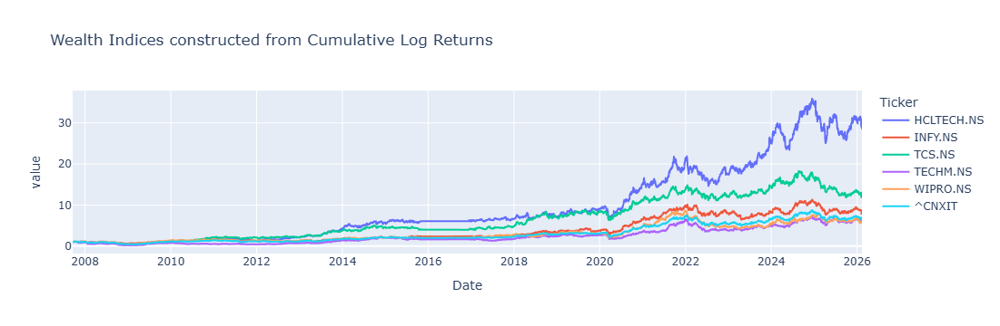

In [72]:
daily_cum_returns = np.exp(log_returns.cumsum())
daily_cum_returns.plot(title='Wealth Indices constructed from Cumulative Log Returns')

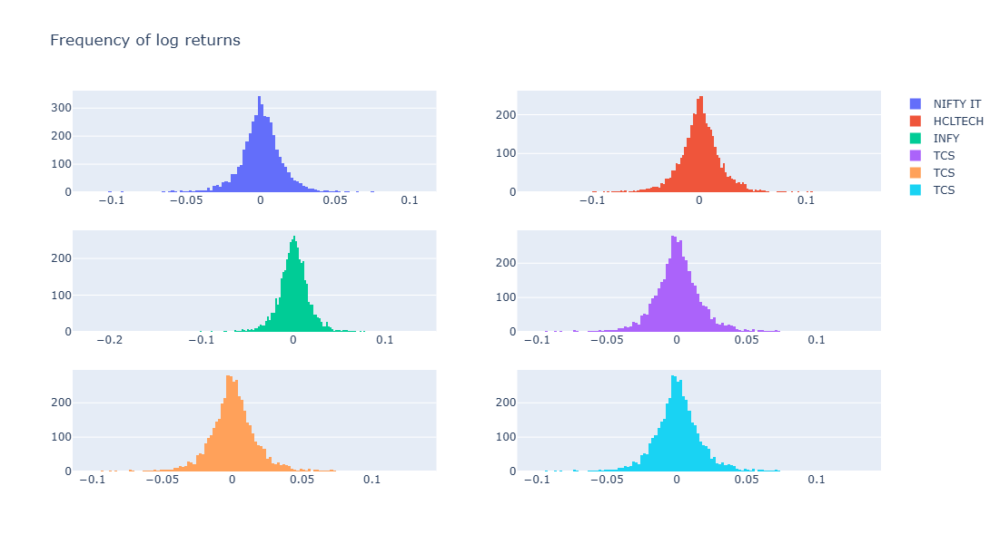

In [42]:
fig = make_subplots(rows=3, cols=2)

img0 = go.Histogram(x=log_returns['^CNXIT'], name='NIFTY IT')
img1 = go.Histogram(x=log_returns['HCLTECH.NS'], name='HCLTECH')
img2 = go.Histogram(x=log_returns['INFY.NS'], name='INFY')
img3 = go.Histogram(x=log_returns['TCS.NS'], name='TCS')
img4 = go.Histogram(x=log_returns['TECHM.NS'], name='TECHM')
img5 = go.Histogram(x=log_returns['WIPRO.NS'], name='WIPRO')

fig.append_trace(img0, 1, 1)  #This is in terms of rows and columns
fig.append_trace(img1, 1, 2)
fig.append_trace(img2, 2, 1)
fig.append_trace(img3, 2, 2)
fig.append_trace(img3, 3, 1)
fig.append_trace(img3, 3, 2)

fig.update_layout(autosize=False, width=1100, height=600, title='Frequency of log returns')

fig.show()

# Daily Standard Deviation

In [45]:
daily_std = log_returns.std()
daily_std

Ticker
HCLTECH.NS    0.021589
INFY.NS       0.018904
TCS.NS        0.018477
TECHM.NS      0.022946
WIPRO.NS      0.019477
^CNXIT        0.015666
dtype: float64

# Annualized Volatility

In [48]:
annualized_volatility = daily_std * np.sqrt(252)
annualized_volatility

Ticker
HCLTECH.NS    0.342714
INFY.NS       0.300097
TCS.NS        0.293315
TECHM.NS      0.364262
WIPRO.NS      0.309188
^CNXIT        0.248683
dtype: float64

# Historical Volatility

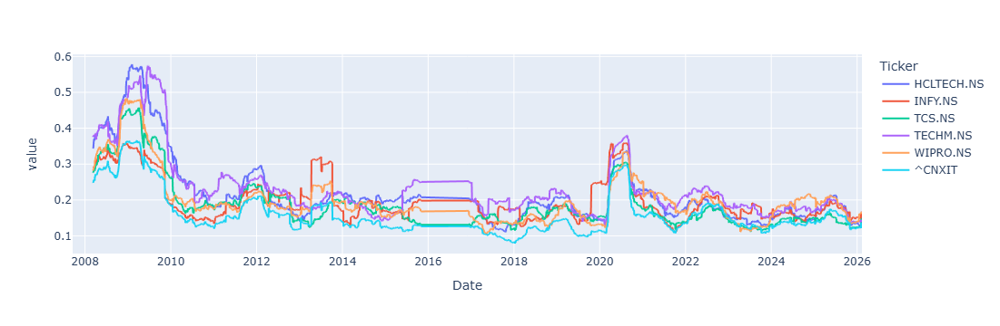

In [53]:
Trading_days = 120

historical_volatility = log_returns.rolling(window=Trading_days).std() * np.sqrt(Trading_days)
historical_volatility.plot()

# Sharpe Ratio

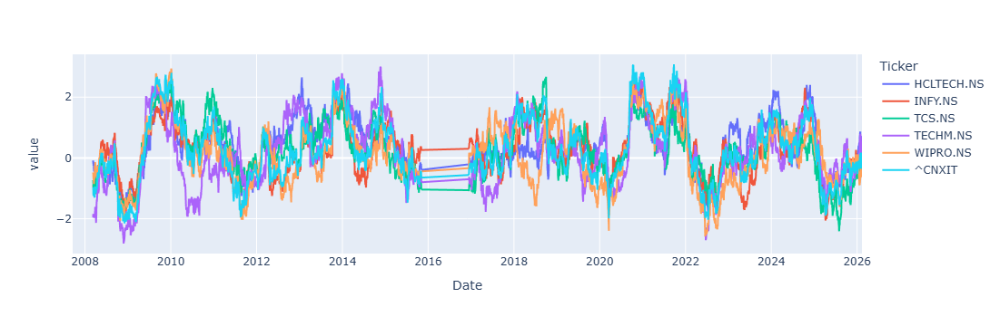

In [58]:
Rf = 0.06/252

Sharpe_ratio = (log_returns.rolling(window=Trading_days).mean() - Rf) * Trading_days / historical_volatility
Sharpe_ratio.plot()

# Sortino Ratio

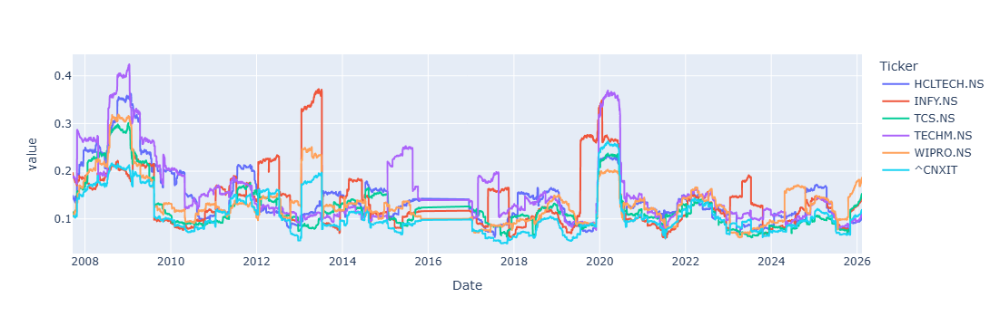

In [68]:
# Here I'm taking a downside risk which is less than 0 on any given day


sortino_volatility = log_returns[log_returns<0].rolling(window=Trading_days, center=True, min_periods=10).std() * np.sqrt(Trading_days)

sortino_ratio = (log_returns.rolling(window=Trading_days).mean() - Rf) * Trading_days / sortino_volatility

sortino_volatility.plot()

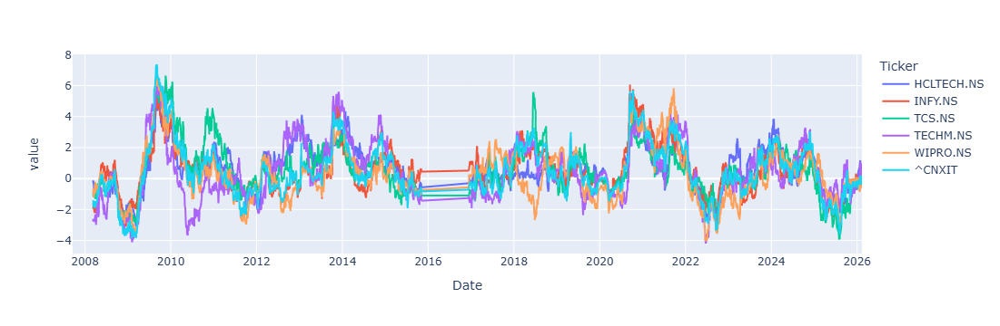

In [74]:
sortino_ratio.plot()

# Drawdown Analysis

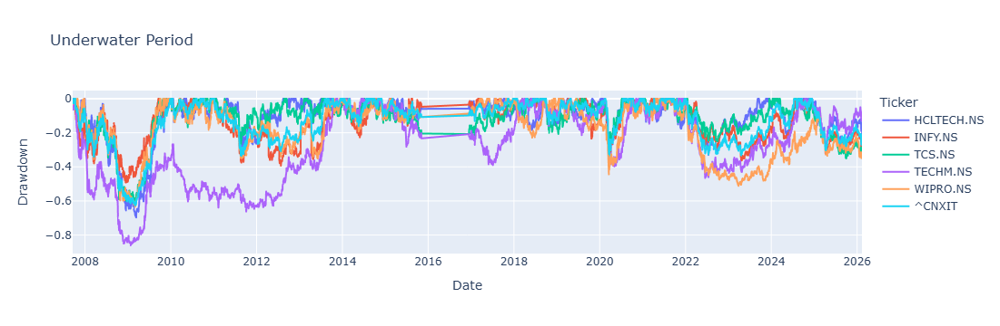

In [77]:
peak = daily_cum_returns.cummax()

drawdown = daily_cum_returns / peak - 1

drawdown.plot(title='Underwater Period',
              labels={'value':'Drawdown'})

# Maximum Drawdown

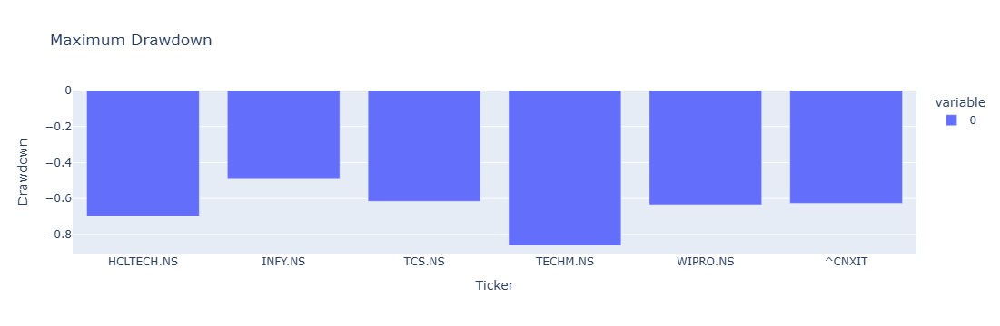

In [86]:
max_dd = drawdown.min()
max_dd.plot(kind='bar', title='Maximum Drawdown',
           labels={'value':'Drawdown'})

# Recovery Period

In [91]:
import plotly.express as px

In [89]:
daily_cum_returns = np.exp(log_returns.cumsum())
series = daily_cum_returns['^CNXIT']

peak = series.cummax()
underwater = series < peak

recovery_durations = []
duration = 0

for is_underwater in underwater:
    if is_underwater:
        duration += 1
    else:
        if duration > 0:
            recovery_durations.append(duration)
            duration = 0

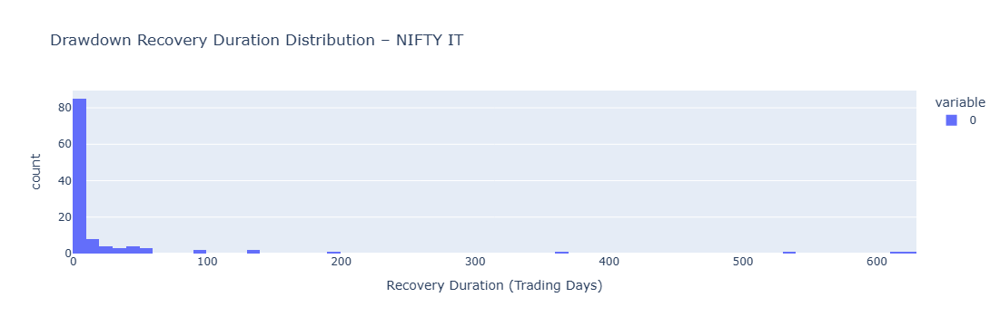

In [93]:
px.histogram(
    recovery_durations,
    nbins=70,
    title="Drawdown Recovery Duration Distribution – NIFTY IT",
    labels={"value": "Recovery Duration (Trading Days)", "count": "Frequency"}
).show()

In [95]:
daily_cum_returns = np.exp(log_returns.cumsum())
series = daily_cum_returns['HCLTECH.NS']

peak = series.cummax()
underwater = series < peak

recovery_durations = []
duration = 0

for is_underwater in underwater:
    if is_underwater:
        duration += 1
    else:
        if duration > 0:
            recovery_durations.append(duration)
            duration = 0

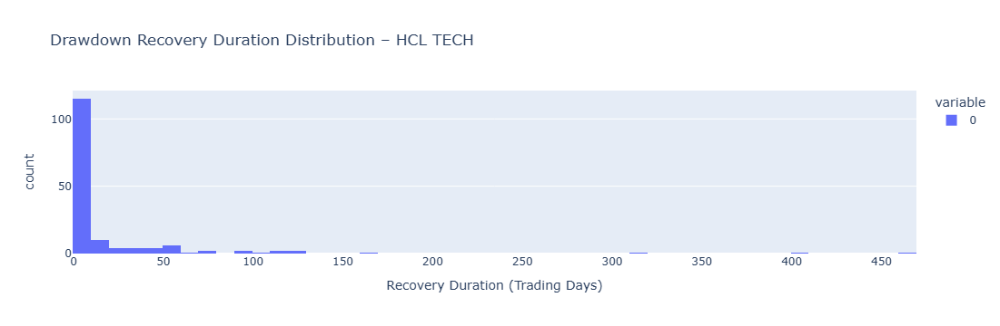

In [97]:
px.histogram(
    recovery_durations,
    nbins=70,
    title="Drawdown Recovery Duration Distribution – HCL TECH",
    labels={"value": "Recovery Duration (Trading Days)", "count": "Frequency"}
).show()

In [101]:
daily_cum_returns = np.exp(log_returns.cumsum())
series = daily_cum_returns['INFY.NS']

peak = series.cummax()
underwater = series < peak

recovery_durations = []
duration = 0

for is_underwater in underwater:
    if is_underwater:
        duration += 1
    else:
        if duration > 0:
            recovery_durations.append(duration)
            duration = 0

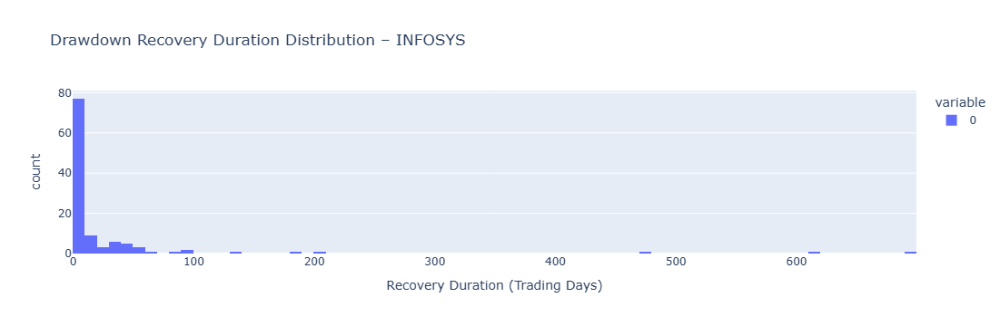

In [103]:
px.histogram(
    recovery_durations,
    nbins=70,
    title="Drawdown Recovery Duration Distribution – INFOSYS",
    labels={"value": "Recovery Duration (Trading Days)", "count": "Frequency"}
).show()

In [105]:
daily_cum_returns = np.exp(log_returns.cumsum())
series = daily_cum_returns['TCS.NS']

peak = series.cummax()
underwater = series < peak

recovery_durations = []
duration = 0

for is_underwater in underwater:
    if is_underwater:
        duration += 1
    else:
        if duration > 0:
            recovery_durations.append(duration)
            duration = 0

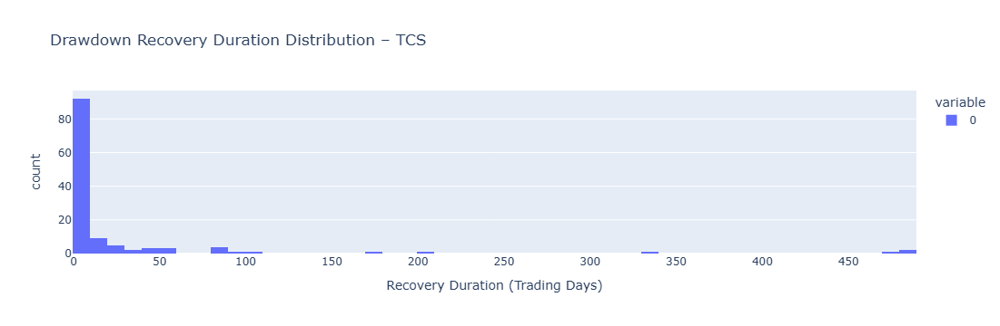

In [107]:
px.histogram(
    recovery_durations,
    nbins=70,
    title="Drawdown Recovery Duration Distribution – TCS",
    labels={"value": "Recovery Duration (Trading Days)", "count": "Frequency"}
).show()

In [121]:
daily_cum_returns = np.exp(log_returns.cumsum())
series = daily_cum_returns['TECHM.NS']

peak = series.cummax()
underwater = series < peak

recovery_durations = []
duration = 0

for is_underwater in underwater:
    if is_underwater:
        duration += 1
    else:
        if duration > 0:
            recovery_durations.append(duration)
            duration = 0

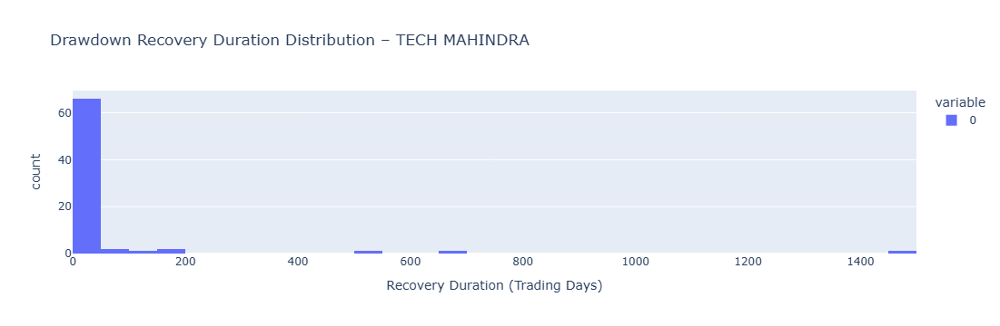

In [123]:
px.histogram(
    recovery_durations,
    nbins=70,
    title="Drawdown Recovery Duration Distribution – TECH MAHINDRA",
    labels={"value": "Recovery Duration (Trading Days)", "count": "Frequency"}
).show()

In [125]:
daily_cum_returns = np.exp(log_returns.cumsum())
series = daily_cum_returns['WIPRO.NS']

peak = series.cummax()
underwater = series < peak

recovery_durations = []
duration = 0

for is_underwater in underwater:
    if is_underwater:
        duration += 1
    else:
        if duration > 0:
            recovery_durations.append(duration)
            duration = 0

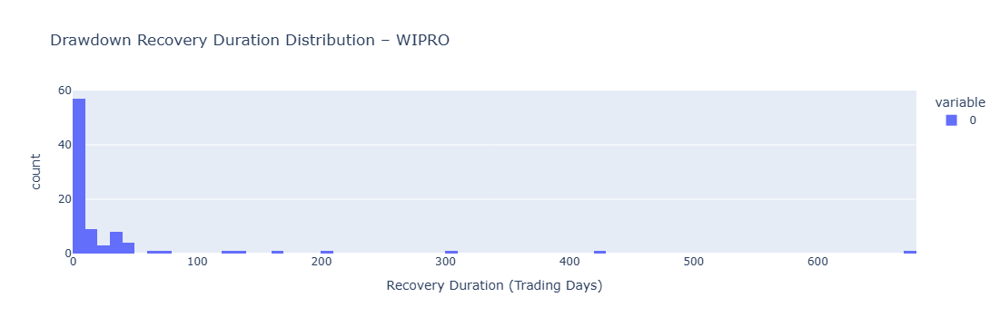

In [127]:
px.histogram(
    recovery_durations,
    nbins=70,
    title="Drawdown Recovery Duration Distribution – WIPRO",
    labels={"value": "Recovery Duration (Trading Days)", "count": "Frequency"}
).show()